# Classification Project 2

# 1. Import Required Libraries

In [1]:
# Import required libraries and tools:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import itertools
from scipy import stats  # Import for IQR outlier detection


from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, cross_val_score, train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, roc_curve, precision_score, recall_score, f1_score, confusion_matrix, classification_report, jaccard_score, r2_score

color_list = sns.color_palette('pastel')

# 2. Import and Read Dataset

In [2]:
# Import Dataset
train_data = pd.read_csv('mobileprice_train.csv')
df_train = pd.DataFrame(train_data)

test_data = pd.read_csv('mobileprice_test.csv')
df_test = pd.DataFrame(test_data)

In [3]:
print ('The first 5 rows of train dataset: ')
df_train.head(5)


The first 5 rows of train dataset: 


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [4]:

print ('The first 5 rows of test dataset: ')
df_test.head(5)

The first 5 rows of test dataset: 


,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [5]:
print(f"The train dataset has {df_train.shape[0]} rows and {df_train.shape[1]} columns.")
print(f"The test dataset has {df_test.shape[0]} rows and {df_test.shape[1]} columns.")


The train dataset has 2000 rows and 21 columns.
The test dataset has 1000 rows and 21 columns.


In [6]:
df_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1000 non-null   int64  
 1   battery_power  1000 non-null   int64  
 2   blue           1000 non-null   int64  
 3   clock_speed    1000 non-null   float64
 4   dual_sim       1000 non-null   int64  
 5   fc             1000 non-null   int64  
 6   four_g         1000 non-null   int64  
 7   int_memory     1000 non-null   int64  
 8   m_dep          1000 non-null   float64
 9   mobile_wt      1000 non-null   int64  
 10  n_cores        1000 non-null   int64  
 11  pc             1000 non-null   int64  
 12  px_height      1000 non-null   int64  
 13  px_width       1000 non-null   int64  
 14  ram            1000 non-null   int64  
 15  sc_h           1000 non-null   int64  
 16  sc_w           1000 non-null   int64  
 17  talk_time      1000 non-null   int64  
 18  three_g  

In [8]:
df_train.describe(include='all')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


# 3. Data Cleaning

## 3.1. Missing values

In [9]:
# Check for missing values and print their counts
missing_values_per_column = df_train.isnull().sum()
print(missing_values_per_column)

# Alternatively, print a more descriptive output
for column, missing_count in missing_values_per_column.items():
  if missing_count > 0:
    print(f"Column '{column}' has {missing_count} missing values.")

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


### Based on the information above, there are no missing values in the train dataset.

## 3.2. Duplicate values

In [10]:
# Count duplicates in each column
duplicate_counts_train = df_train.duplicated().sum()

# Print the counts
print("Number of duplicate rows in each column:")
print(duplicate_counts_train)

Number of duplicate rows in each column:
0


In [11]:
# Count duplicates in each column
duplicate_counts_test = df_test.duplicated().sum()

# Print the counts
print("Number of duplicate rows in each column:")
print(duplicate_counts_test)

Number of duplicate rows in each column:
0


### Also, there was no duplicate values in the dataset. Now we can analyze if there are any outliers

In [12]:
df_train.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

#### Based on the information above, there are 9 columns with few number of unique values. we call them categorical features including blue, dual_sim, four_g, m_dep, n_cores, three_g, touch_screen, wifi, price_range. Other columns are called continuous features. Next step in the data cleaning is checking for outliers in continuous features.

In [13]:
categorical_features = [
    'blue', 'dual_sim', 'four_g', 'm_dep', 'n_cores', 'three_g', 'touch_screen', 'wifi', 'price_range'
]
continuous_features = [
    'battery_power', 'clock_speed', 'fc', 'int_memory', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time'
]



In [14]:

def identify_outliers_iqr(data, feature_name, color , figsize=(10, 6)):
    """
    Identifies potential outliers in a numerical feature using boxplots and IQR.

    Args:
        data (pd.DataFrame): The DataFrame containing the data.
        feature_name (str): The name of the numerical feature to analyze.
        figsize (tuple, optional): The size of the figure for the boxplot. Defaults to (10, 6).



    Returns:
        None
    """

    # Calculate interquartile range (IQR) for outlier detection
    Q1 = data[feature_name].quantile(0.25)
    Q3 = data[feature_name].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds for outliers based on 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify potential outliers (data points falling outside the bounds)
    outliers = (data[feature_name] < lower_bound) | (data[feature_name] > upper_bound)
    
    color = color_list

    # Create a boxplot using pandas plotting methods
    # Create the boxplot first
    plt.figure(figsize=figsize)
    data.boxplot(column=feature_name, vert=False)
    plt.title(f"Boxplot of {feature_name}")
    plt.xlabel(feature_name)
    plt.ylabel("Value")


    # Calculate and display the number of outliers
    num_outliers = outliers.sum()
    plt.text(
        0.05,
        0.9,
        f"Number of Potential Outliers: {num_outliers}",
        horizontalalignment='left',
        verticalalignment='center',
        transform=plt.gca().transAxes,
    )


    print(f"\nFeature: {feature_name}")
    print(f"# Potential outliers based on IQR: {num_outliers}")


Feature: battery_power
# Potential outliers based on IQR: 0

Feature: clock_speed
# Potential outliers based on IQR: 0

Feature: fc
# Potential outliers based on IQR: 18

Feature: int_memory
# Potential outliers based on IQR: 0

Feature: mobile_wt
# Potential outliers based on IQR: 0

Feature: pc
# Potential outliers based on IQR: 0

Feature: px_height
# Potential outliers based on IQR: 2

Feature: px_width
# Potential outliers based on IQR: 0

Feature: ram
# Potential outliers based on IQR: 0

Feature: sc_h
# Potential outliers based on IQR: 0

Feature: sc_w
# Potential outliers based on IQR: 0

Feature: talk_time
# Potential outliers based on IQR: 0


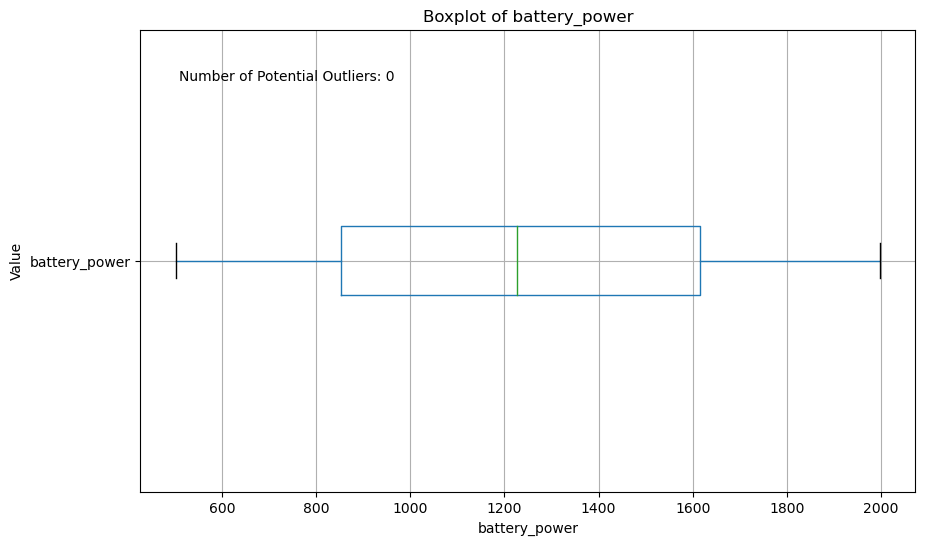

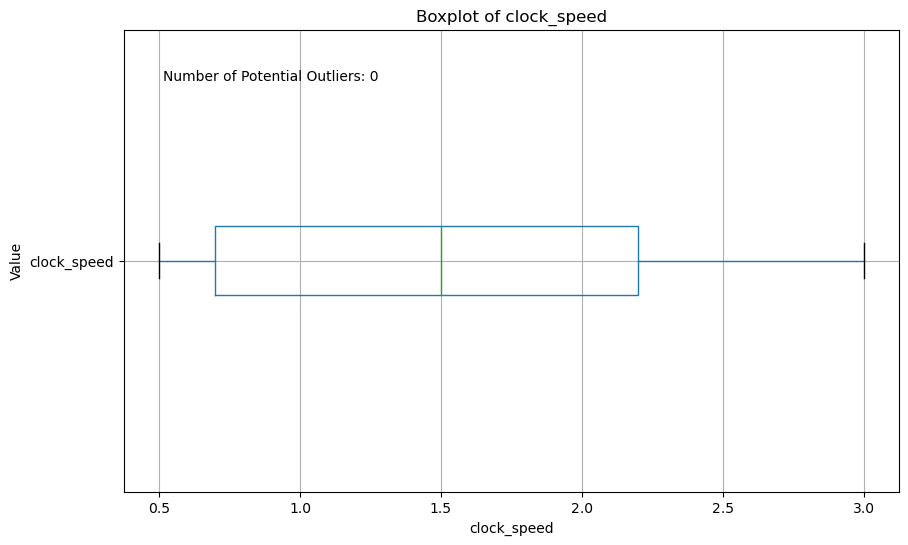

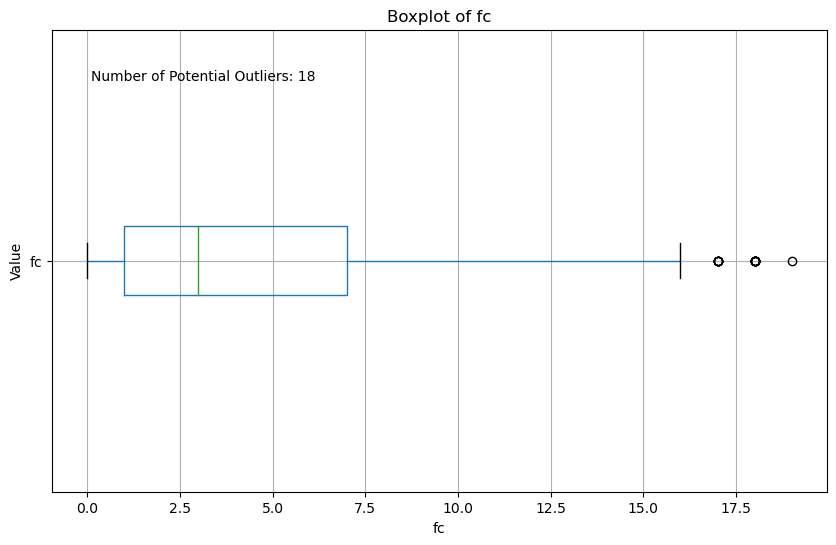

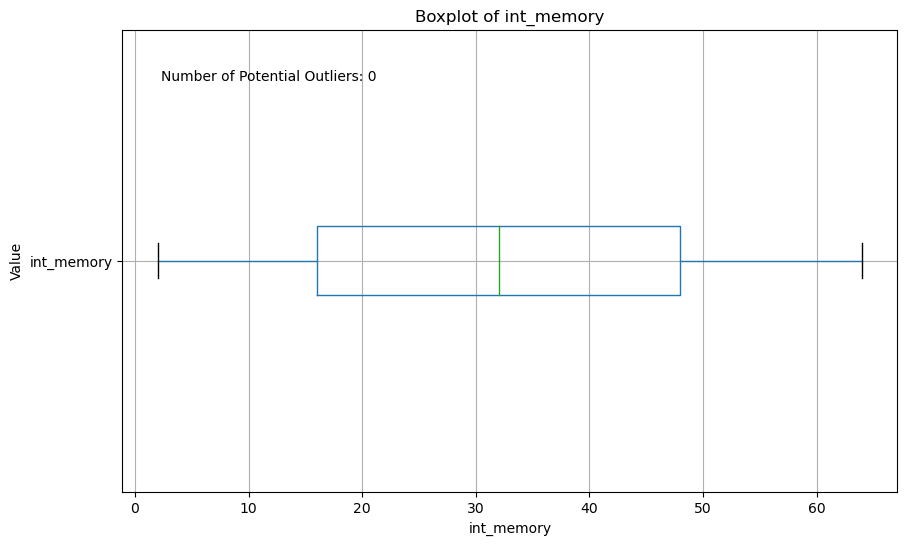

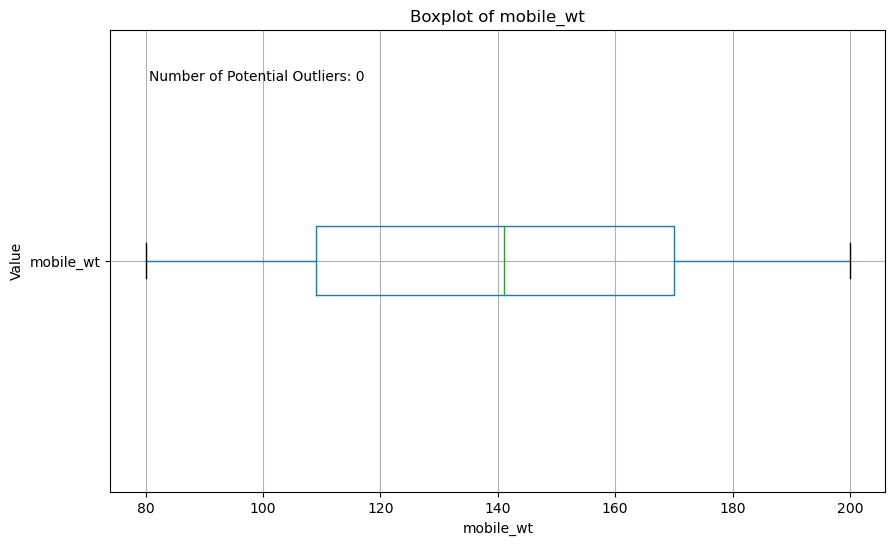

...

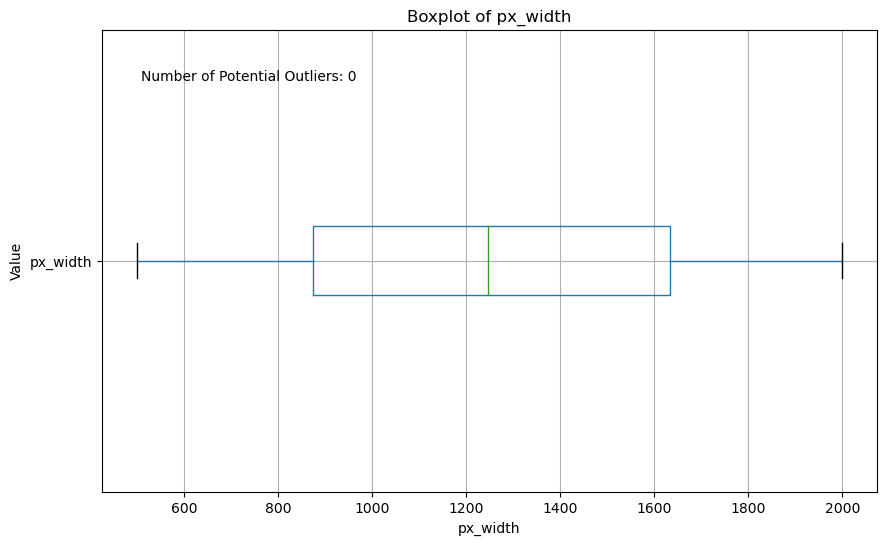

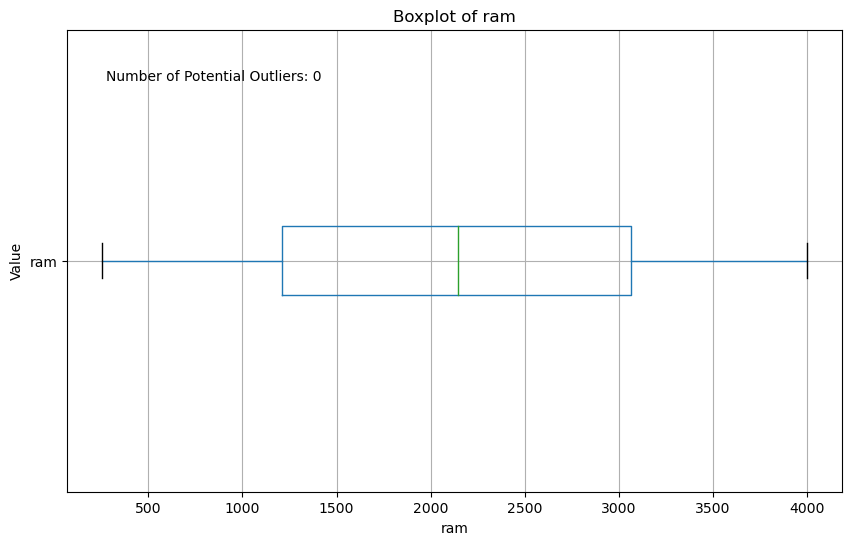

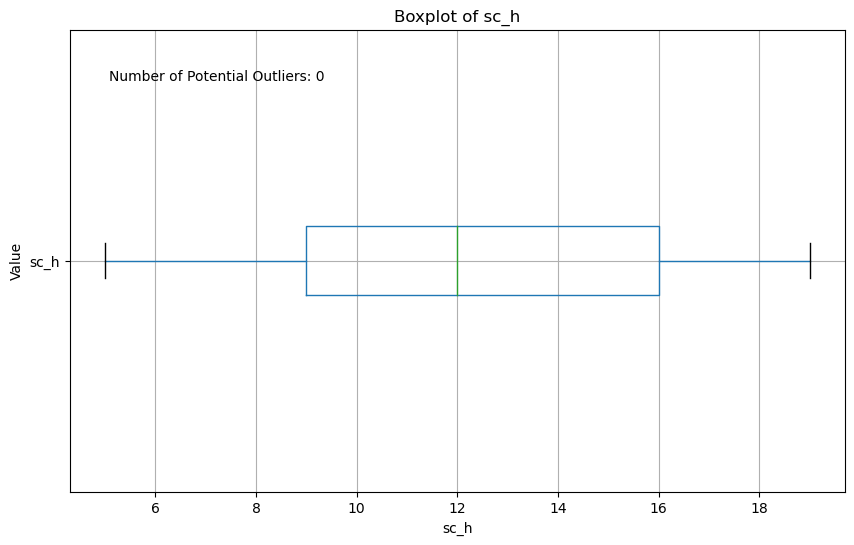

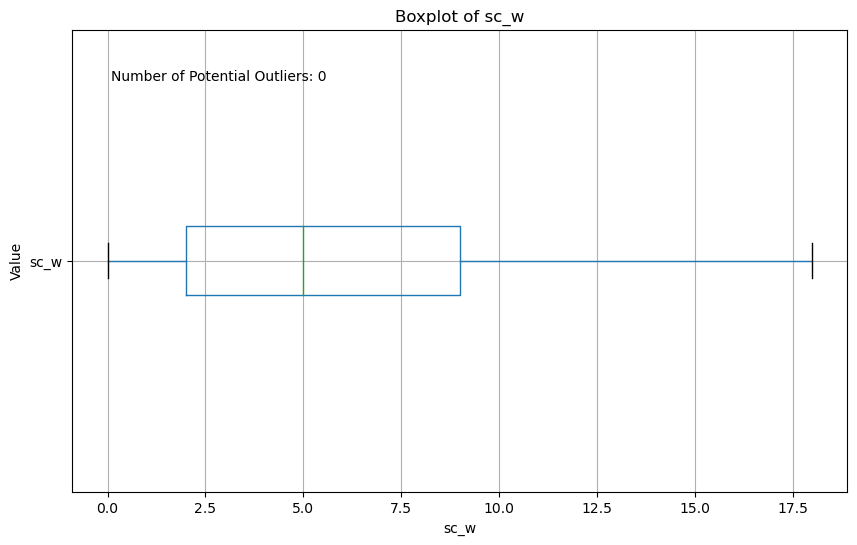

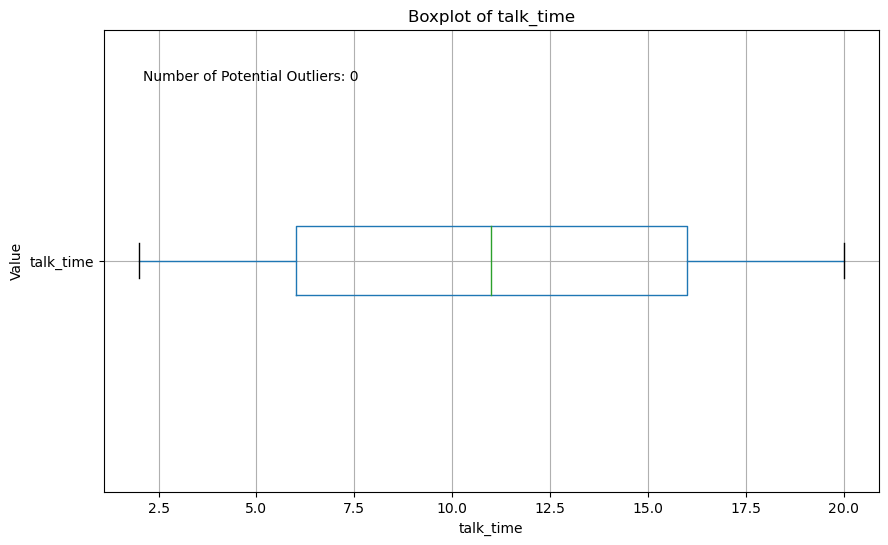

In [15]:
for i in continuous_features:
        identify_outliers_iqr(df_train.copy(), i, color_list)  # Use a copy to avoid modifying original data

#### There are some potential outliers in some of the columns including fc and px_height but we keep them for now because  1. the number of datapoints with potential outlier values are very #### for data cleaning these steps are remaining: 1. two columns now have zero values which does not make sense: px_height and sc_w. we should delete the datapoints that have zeros in these columns. 2. px_height should be more than px_width so we need to swap the values in these two columns.  You can see the code for these steps in the below cells. <br>
#### preparing dataset for medeling includes: normalizing features.  and defining functions for creating the models.

In [16]:
# Swap column names in df_train
df_train_temp = df_train.copy()
df_train_temp.rename(columns={'px_width': 'px_height', 'px_height': 'px_width'}, inplace=True)
print('Done!') if df_train_temp[df_train_temp.px_height < df_train_temp.px_width].shape[0] == 0 else print('Error in px height and width')

Done!


In [17]:
# Swap column names in df_test
df_test_temp = df_test.copy()
df_test_temp.rename(columns={'px_width': 'px_height', 'px_height': 'px_width'}, inplace=True)
print('Done!') if df_test_temp[df_test_temp.px_height < df_test_temp.px_width].shape[0] == 0 else print('Error in px height and width')

Done!


In [18]:
df_temp = df_train.dropna(subset=['px_height', 'sc_w'], inplace=False)
print("Original DataFrame Shape:", df_train.shape)
print("Filtered DataFrame Shape:", df_temp.shape)

Original DataFrame Shape: (2000, 21)
Filtered DataFrame Shape: (2000, 21)


# 4. Exploratory Data Analysis

## 4.1. Univariate analysis

In [19]:
# Function to create countplots for a set of features
def plot_countplots(df, features, title):
  # Calculate number of rows and columns based on features length
  rows = len(features) // 2 + 1 if len(features) % 2 != 0 else len(features) // 2
  cols = 2
  fig, axes = plt.subplots(rows, cols, figsize=(12, 6*rows))

  for i, col in enumerate(features):
    ax = axes.flat[i]
    sns.countplot(data=df, x=col, ax=ax, palette=color_list)
        # Add value counts above each column
    for p in ax.patches:
      height = int(p.get_height())
      ax.annotate(f"{height}",
                   xy=(p.get_x() + p.get_width() / 2, height + 0.1),
                   ha='center', va='bottom')
    ax.set_title(f'Number of values in {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Count')

  # Remove empty subplots if any
  for j in range(len(features), rows*cols):
    fig.delaxes(axes.flatten()[j])

    
  fig.suptitle(title, fontsize=14)
  plt.tight_layout(pad=3)
  plt.show()

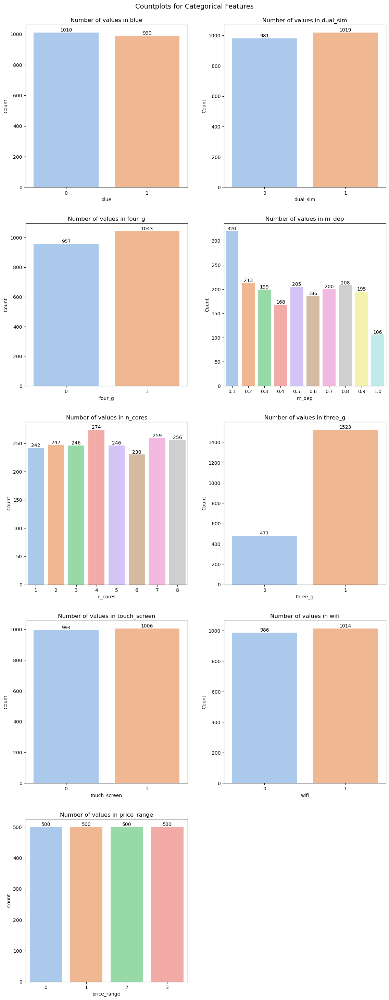

In [20]:
# Plot for categorical features
plot_countplots(df_train, categorical_features, 'Countplots for Categorical Features')

C:\Users\acer\AppData\Local\Temp\ipykernel_190296\1203392335.py:9: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(data=df, x=col, y='price_range', ax=ax, hue='price_range', palette=color_list, alpha=0.7)  # Assuming price_range is a relevant hue variable
C:\Users\acer\AppData\Local\Temp\ipykernel_190296\1203392335.py:9: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(data=df, x=col, y='price_range', ax=ax, hue='price_range', palette=color_list, alpha=0.7)  # Assuming price_range is a relevant hue variable
C:\Users\acer\AppData\Local\Temp\ipykernel_190296\1203392335.py:9: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(data=df, x=col, y='price_range', ax=ax, hue='price_range', palette=color_list, alpha=0.7)  # Assuming price_range is a relevant hue variable
C:\Users\acer\AppData\Local\Temp\ipyk

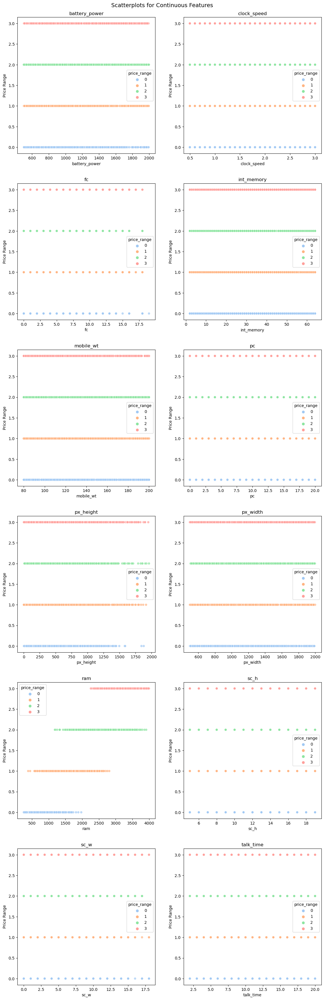

In [21]:
# Function to create scatterplots for continuous features with subplot cleaning
def plot_continuous_features(df, features, title):
    rows = len(features) // 2 + 1 if len(features) % 2 != 0 else len(features) // 2
    cols = 2
    fig, axes = plt.subplots(rows, cols, figsize=(12, 6*rows))

    for i, col in enumerate(features):
        ax = axes.flat[i]
        sns.scatterplot(data=df, x=col, y='price_range', ax=ax, hue='price_range', palette=color_list, alpha=0.7)  # Assuming price_range is a relevant hue variable

        ax.set_title(col)
        ax.set_xlabel(col)
        ax.set_ylabel('Price Range')

  # Remove empty subplots if any
    for j in range(len(features), rows*cols):
        fig.delaxes(axes.flatten()[j])

    fig.suptitle(title, fontsize=14)
    plt.tight_layout(pad=3)
    plt.show()

plot_continuous_features(df_train, continuous_features, 'Scatterplots for Continuous Features')


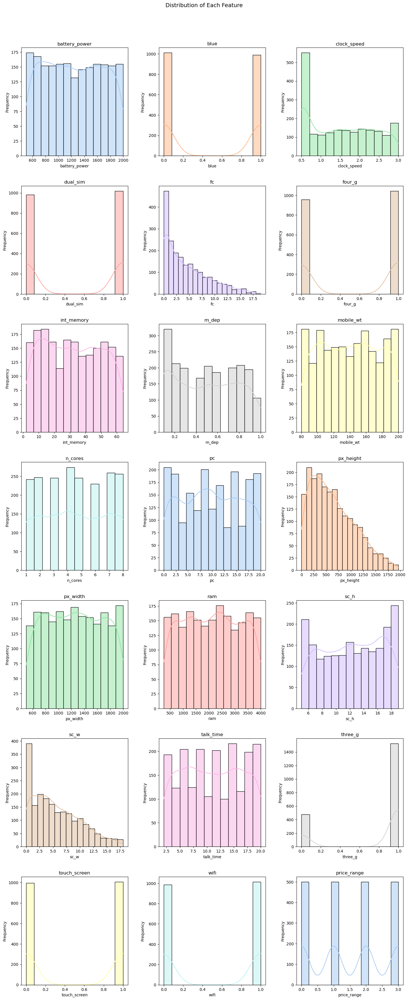

In [22]:
# Function to create histograms for each column
def plot_histograms(df, title, color_list):
  rows = len(df.columns) // 3 + 1 if len(df.columns) % 3 != 0 else len(df.columns) // 3
  cols = 3
  fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))

  # Create a main title for the entire figure
  fig.suptitle(title, fontsize=14, y=1.01)  # Positioned slightly above subplots

  for i, col in enumerate(df.columns):
    ax = axes.flat[i]
    sns.histplot(data=df, x=col, ax=ax, color=color_list[i % len(color_list)], kde=True)
    ax.grid(False)
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

  # Remove empty subplots if any
  for j in range(len(df.columns), rows*cols):
    fig.delaxes(axes.flatten()[j])

  plt.tight_layout(pad=3)
  plt.show()

# Plot histograms for all columns
plot_histograms(df_train.copy(), 'Distribution of Each Feature', color_list)


## 4.2. Bivariate analysis

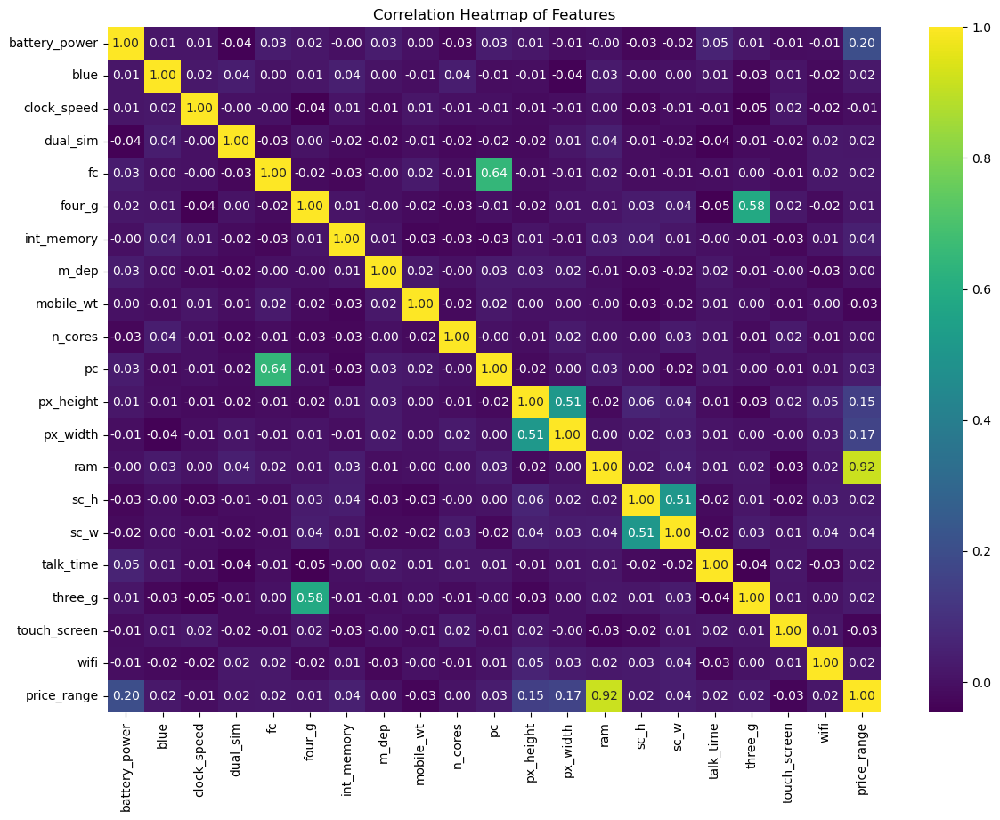

In [25]:
#heatmap
  # Select only numerical or categorical features (excluding object type)
correlation_matrix = df_train.select_dtypes(include=[np.number]).corr()

  # Create a heatmap using seaborn
plt.figure(figsize=(14, 10))  # Set the figure size
fmt = ".2f"  # Format string to display two decimal places
sns.heatmap(correlation_matrix, annot=True, cmap="viridis", fmt=fmt)

  # Customize the plot (optional)
plt.title("Correlation Heatmap of Features")
plt.show()

### Based on the heatmap, the ram column has the most correlation with price_range. other factors include battery_power, px_height and px_width.

## 4.3. Multivariate analysis

C:\Users\acer\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


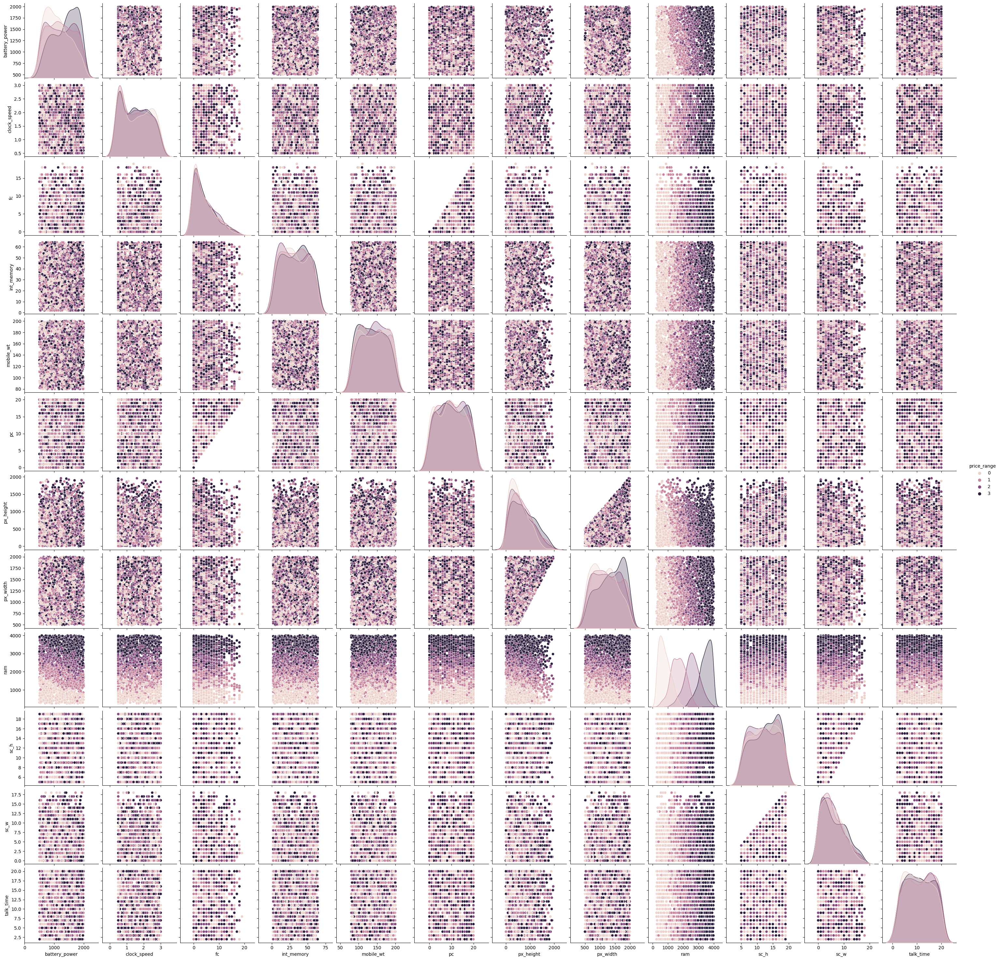

In [27]:
#pairplot
sns.pairplot(df_train, x_vars = continuous_features, y_vars = continuous_features, hue='price_range')

### This plot also highlights the significance of RAM within this price range. The darker colors represent higher prices, which is notably associated with greater RAM capacity.

## Let's have a more detailed look on important features:
    

### As mentioned earlier, the most correlated feature is ram. so we visualize its correlation with other important features i.e. battery_power, px_height and px_width.

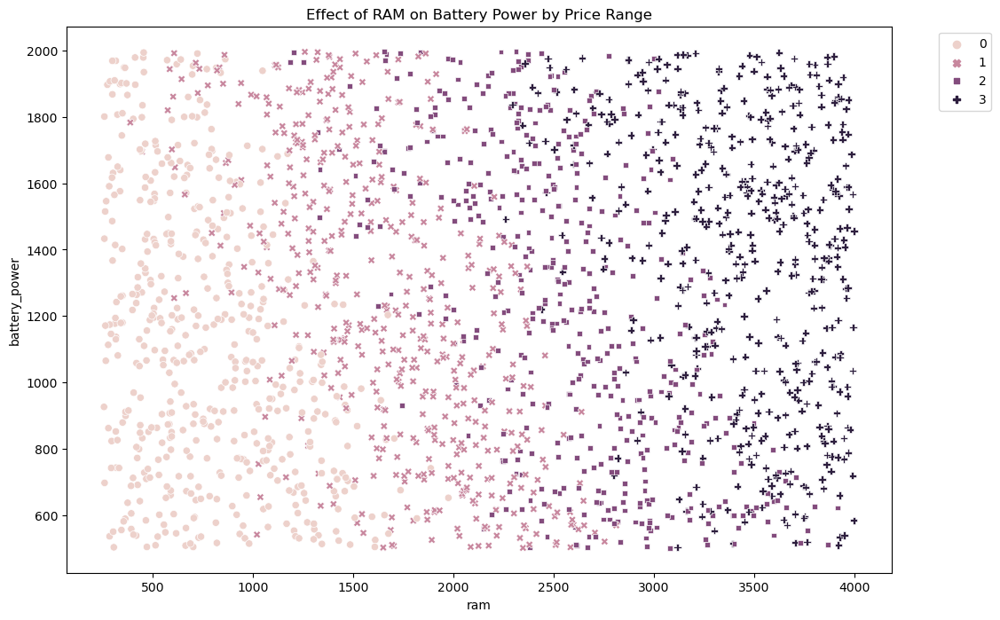

In [33]:
# Adjust figure size (increase width and height)
plt.figure(figsize=(12, 8))  # Example, adjust as needed

# Create the scatter plot with color-coding and styling
sns.scatterplot(df_train, x='ram', y='battery_power', hue='price_range', style='price_range')

# Move legend outside the plot area
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))  # Adjust x and y offsets as needed

# Set a title for the graph
plt.title('Effect of RAM on Battery Power by Price Range')  # Adjust title as needed

plt.show()


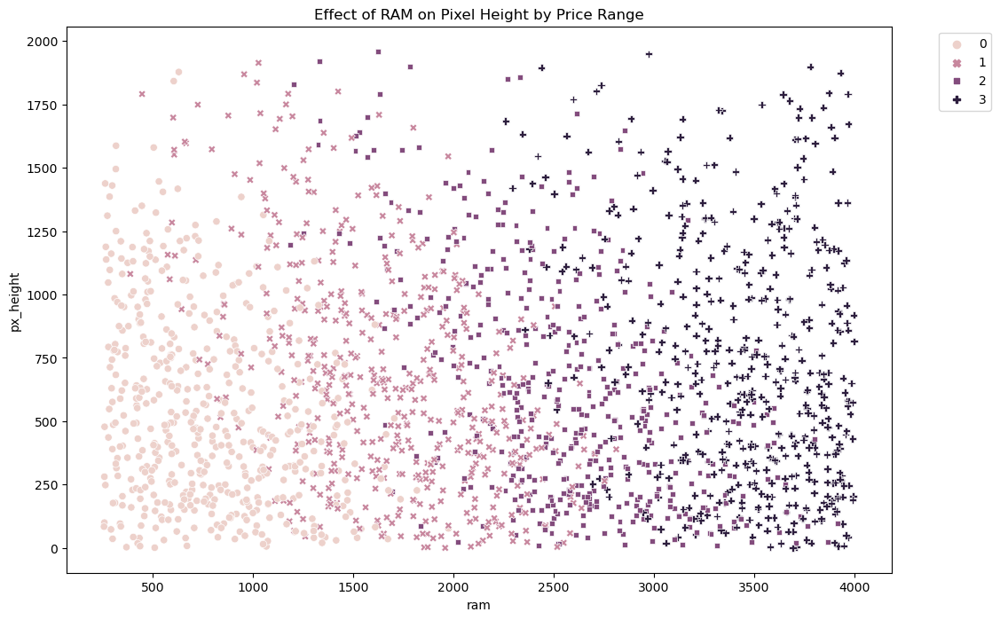

In [34]:
# Adjust figure size (increase width and height)
plt.figure(figsize=(12, 8))  # Example, adjust as needed

# Create the scatter plot with color-coding and styling
sns.scatterplot(df_train, x='ram', y='px_height', hue='price_range', style='price_range')

# Move legend outside the plot area
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))  # Adjust x and y offsets as needed

# Set a title for the graph
plt.title('Effect of RAM on Pixel Height by Price Range')  # Adjust title as needed

plt.show()

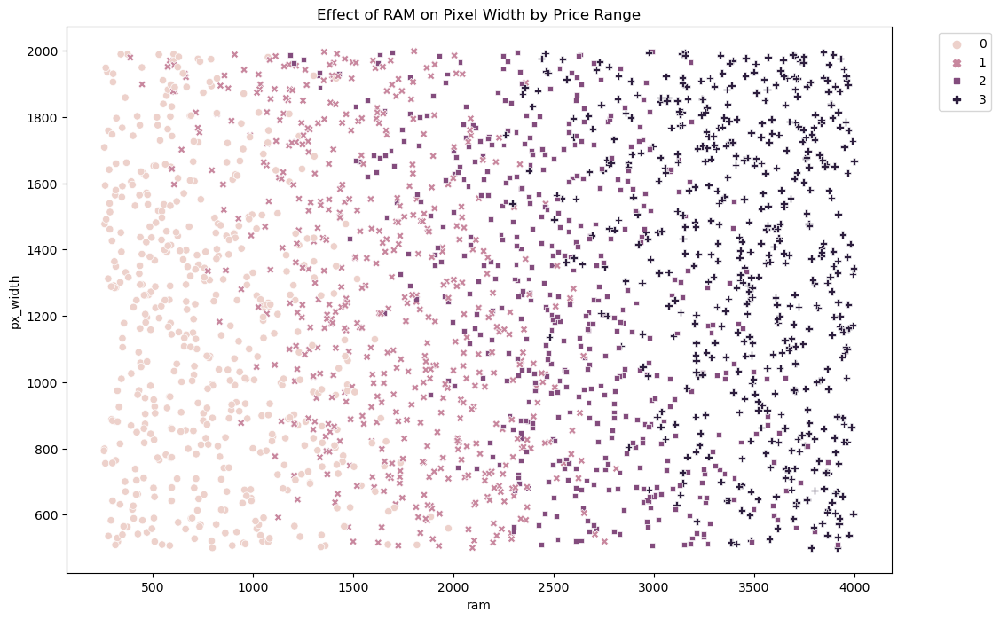

In [35]:
# Adjust figure size (increase width and height)
plt.figure(figsize=(12, 8))  # Example, adjust as needed

# Create the scatter plot with color-coding and styling
sns.scatterplot(df_train, x='ram', y='px_width', hue='price_range', style='price_range')

# Move legend outside the plot area
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))  # Adjust x and y offsets as needed

# Set a title for the graph
plt.title('Effect of RAM on Pixel Width by Price Range')  # Adjust title as needed

plt.show()

# 5. Preparing dataset for modeling:

In [37]:


scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(df_train)
df_normal = pd.DataFrame(scaler.transform(df_train), columns=df_train.columns)  # Convert to DataFrame
print(df_normal.head())




   battery_power  blue  clock_speed  dual_sim        fc  four_g  int_memory  \
0       0.227789   0.0         0.68       0.0  0.052632     0.0    0.080645   
1       0.347361   1.0         0.00       1.0  0.000000     1.0    0.822581   
2       0.041416   1.0         0.00       1.0  0.105263     1.0    0.629032   
3       0.076152   1.0         0.80       0.0  0.000000     0.0    0.129032   
4       0.881764   1.0         0.28       0.0  0.684211     1.0    0.677419   

      m_dep  mobile_wt   n_cores  ...  px_height  px_width       ram  \
0  0.555556   0.900000  0.142857  ...   0.010204  0.170895  0.612774   
1  0.666667   0.466667  0.285714  ...   0.461735  0.993324  0.634687   
2  0.888889   0.541667  0.571429  ...   0.644388  0.811749  0.627205   
3  0.777778   0.425000  0.714286  ...   0.620408  0.858478  0.671566   
4  0.555556   0.508333  0.142857  ...   0.616327  0.475300  0.308658   

       sc_h      sc_w  talk_time  three_g  touch_screen  wifi  price_range  
0  0.285714  0.

In [44]:
X = df_train.drop("price_range", axis=1)
y = df_train["price_range"]
test_sizes=[0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]

In [45]:
def SVM_model(df, test_size, kernel, C):
  """
  Fits a Support Vector Machine (SVM) model to a DataFrame using a list of test sizes and evaluates performance.

  Args:
    df (pandas.DataFrame): The DataFrame containing the features.
    target_col (str): The name of the target column.
    test_sizes (list, optional): A list of test size proportions. Defaults to [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4].
    kernel (str, optional): The kernel type for the SVM. Defaults to 'linear'.
    C (float, optional): Regularization parameter for the SVM. Defaults to 1.0.

  Returns:
    None (prints evaluation metrics for each test size).
  """

  for test_size in test_sizes:
    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)  # Set random_state for reproducibility 

    # Create and fit the SVM model
    model = SVC(kernel=kernel, C=C)
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')  # Set appropriate average for multiclass
    f1 = f1_score(y_test, y_pred, average='weighted')  # Average for multiclass


    # Print evaluation results for this test size
    print(f"Test Size: {test_size:.2f}")
    print(f"\tAccuracy: {accuracy:.4f}")
    print(f"\tPrecision: {precision:.4f}")
    print(f"\tF1-Score: {f1:.4f}")
    print("-" * 30)  # Separator between test sizes


SVM_model(df_train, test_size = test_sizes, kernel = 'linear', C = 1.0)


Test Size: 0.10
	Accuracy: 0.9750
	Precision: 0.9755
	F1-Score: 0.9750
------------------------------
Test Size: 0.15
	Accuracy: 0.9667
	Precision: 0.9687
	F1-Score: 0.9667
------------------------------
Test Size: 0.20
	Accuracy: 0.9700
	Precision: 0.9720
	F1-Score: 0.9702
------------------------------
Test Size: 0.25
	Accuracy: 0.9700
	Precision: 0.9710
	F1-Score: 0.9700
------------------------------
Test Size: 0.30
	Accuracy: 0.9733
	Precision: 0.9742
	F1-Score: 0.9733
------------------------------
Test Size: 0.35
	Accuracy: 0.9743
	Precision: 0.9746
	F1-Score: 0.9743
------------------------------
Test Size: 0.40
	Accuracy: 0.9712
	Precision: 0.9716
	F1-Score: 0.9713
------------------------------


### Based on the reports above, the highest performance metrics of SVM model is related to the test size = 0.10: <br>

#### Accuracy: 0.9750 <br>
#### Precision: 0.9755<br>
#### F1-Score: 0.9750<br>

In [53]:
def decision_tree_model(df, test_size, random_state=42):
    """
    Fits Decision Tree models with different max_depth values to a DataFrame using a list of test sizes and evaluates performance.

    Args:
        df (pandas.DataFrame): The DataFrame containing the features.
        target_col (str): The name of the target column.
        test_sizes (list, optional): A list of test size proportions. Defaults to [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4].
        random_state (int, optional): Seed for reproducibility. Defaults to 42.

    Returns:
        None (prints evaluation metrics for each test size and max_depth combination).
    """

    max_depths = range(2, 11)  # Range of max_depth values (2 to 10)

    best_accuracy_model = None
    best_accuracy = 0.0
    best_f1_model = None
    best_f1 = 0.0
    best_precision_model = None
    best_precision = 0.0

    for test_size in test_sizes:
        for max_depth in max_depths:
            # Split data into training and testing sets
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

            # Create and fit the decision tree model
            model = DecisionTreeClassifier(max_depth=max_depth)
            model.fit(X_train, y_train)

            # Make predictions on the test set
            y_pred = model.predict(X_test)

            # Calculate evaluation metrics
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred, average='weighted')
            f1 = f1_score(y_test, y_pred, average='weighted')

            # Update best models based on metrics
            if accuracy > best_accuracy:
                best_accuracy_model = (test_size, max_depth, model)
                best_accuracy = accuracy
            if f1 > best_f1:
                best_f1_model = (test_size, max_depth, model)
                best_f1 = f1
            if precision > best_precision:
                best_precision_model = (test_size, max_depth, model)
                best_precision = precision

            # Print evaluation results for this test size and max_depth
            print(f"Test Size: {test_size:.2f}, Max Depth: {max_depth}")
            print(f"\tAccuracy: {accuracy:.4f}")
            print(f"\tPrecision: {precision:.4f}")
            print(f"\tF1-Score: {f1:.4f}")
            print("-" * 30)  # Separator between models

    # Print best models after iterating through all combinations
    print("\n** Best Models Based on Metrics:**")

    if best_accuracy_model:
        test_size, max_depth, model = best_accuracy_model
        print(f"\tAccuracy: Test Size - {test_size:.2f}, Max Depth - {max_depth}")
    else:
        print("\tAccuracy: No model found with best accuracy.")

    if best_f1_model:
        test_size, max_depth, model = best_f1_model
        print(f"\tF1-Score: Test Size - {test_size:.2f}, Max Depth - {max_depth}")
    else:
        print("\tF1-Score: No model found with best F1-score.")

    if best_precision_model:
        test_size, max_depth, model = best_precision_model
        print(f"\tPrecision: Test Size - {test_size:.2f}, Max Depth - {max_depth}")
    else:
        print("\tF1-Score: No model found with best Precision.")


decision_tree_model(df_train, test_size = test_sizes, random_state=42)

Test Size: 0.10, Max Depth: 2
	Accuracy: 0.7750
	Precision: 0.7906
	F1-Score: 0.7776
------------------------------
Test Size: 0.10, Max Depth: 3
	Accuracy: 0.7650
	Precision: 0.7913
	F1-Score: 0.7687
------------------------------
Test Size: 0.10, Max Depth: 4
	Accuracy: 0.8400
	Precision: 0.8424
	F1-Score: 0.8389
------------------------------
Test Size: 0.10, Max Depth: 5
	Accuracy: 0.8450
	Precision: 0.8492
	F1-Score: 0.8461
------------------------------
Test Size: 0.10, Max Depth: 6
	Accuracy: 0.8600
	Precision: 0.8643
	F1-Score: 0.8613
------------------------------
Test Size: 0.10, Max Depth: 7
	Accuracy: 0.8450
	Precision: 0.8496
	F1-Score: 0.8462
------------------------------
Test Size: 0.10, Max Depth: 8
	Accuracy: 0.8650
	Precision: 0.8676
	F1-Score: 0.8652
------------------------------
Test Size: 0.10, Max Depth: 9
	Accuracy: 0.8700
	Precision: 0.8733
	F1-Score: 0.8709
------------------------------
Test Size: 0.10, Max Depth: 10
	Accuracy: 0.8500
	Precision: 0.8521
	F1-

### Based on the reports above, the highest performance metrics of Decision Tree model is related to the Test Size: 0.10 and Max Depth: 9 <br>
#### Accuracy: 0.8700 <br>
#### Precision: 0.8733 <br>
#### F1-Score: 0.8709 <br>

In [49]:
def random_forest_model(df, test_sizes, n_estimators=100, random_state=42):
  """
  Fits a Random Forest model to a DataFrame using a list of test sizes and evaluates performance.

  Args:
    df (pandas.DataFrame): The DataFrame containing the features.
    target_col (str): The name of the target column.
    test_sizes (list, optional): A list of test size proportions. Defaults to [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4].
    n_estimators (int, optional): The number of trees in the forest. Defaults to 100.
    random_state (int, optional): Seed for reproducibility. Defaults to 42.

  Returns:
    None (prints evaluation metrics for each test size).
  """

  for test_size in test_sizes:
    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Create and fit the random forest model
    model = RandomForestClassifier(n_estimators=n_estimators)
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Print evaluation results for this test size
    print(f"Test Size: {test_size:.2f}")
    print(f"\tAccuracy: {accuracy:.4f}")
    print(f"\tPrecision: {precision:.4f}")
    print(f"\tF1-Score: {f1:.4f}")
    print("-" * 30)  # Separator between test sizes



random_forest_model(df_train, test_sizes, n_estimators=100, random_state=42)


Test Size: 0.10
	Accuracy: 0.8800
	Precision: 0.8827
	F1-Score: 0.8804
------------------------------
Test Size: 0.15
	Accuracy: 0.8967
	Precision: 0.8976
	F1-Score: 0.8970
------------------------------
Test Size: 0.20
	Accuracy: 0.8775
	Precision: 0.8803
	F1-Score: 0.8783
------------------------------
Test Size: 0.25
	Accuracy: 0.8820
	Precision: 0.8818
	F1-Score: 0.8818
------------------------------
Test Size: 0.30
	Accuracy: 0.8717
	Precision: 0.8722
	F1-Score: 0.8718
------------------------------
Test Size: 0.35
	Accuracy: 0.8757
	Precision: 0.8762
	F1-Score: 0.8753
------------------------------
Test Size: 0.40
	Accuracy: 0.8725
	Precision: 0.8726
	F1-Score: 0.8723
------------------------------


### Based on the reports above, the highest performance metrics of Random Forest model is related to the Test Size: 0.15 :  <br>
#### Accuracy: 0.8967 <br>
#### Precision: 0.8976 <br>
#### F1-Score: 0.8970 <br>

### Insights from the above models: <br>
#### 1. the peformance of SVM model was significantly higher than other models with 0.97 or higher for all three metrics. <br> 2. The Random Forest model was slightly better than the decision tree which is because of its algorithm and the fact that it uses multiple "trees" for a better modeling. <br> 3. The smaller test sizes had generally better performances. <br> 4. I tried the decison tree code with different range of max_depths from 1-20 and ran it several times. The most frequent best model was with max_depth 7-9, so I deleted the extra range and limited it to 10. For our dataset, this is the best option and creates good models without overcomplexity.